In [2]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import scipy as sp
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


## Cжатие изображений с помощью PCA

Загружаем картинку

In [4]:
image = plt.imread('3840x2400.png')
image.shape

(2400, 3840, 3)

Применим к картинке преобразование для выделения 24 блоков размера 600x640

In [5]:
X = image.transpose((1, 2, 0)).reshape((3840, 3, 4, 600)) \
         .transpose((1, 2, 3, 0)).reshape((3, 4, 600, 6, 640)) \
         .transpose((1, 3, 2, 4, 0)).reshape((4 * 6, 600 * 640 * 3))
print(X.shape)

(24, 1152000)


Визуализируем блоки.
Как видим, все правильно.

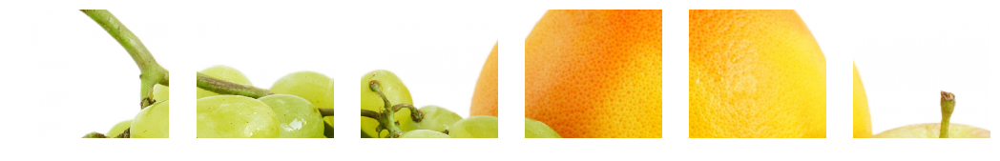

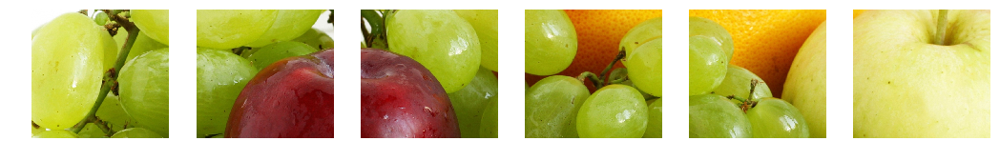

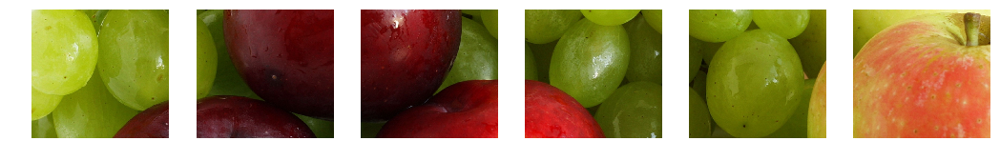

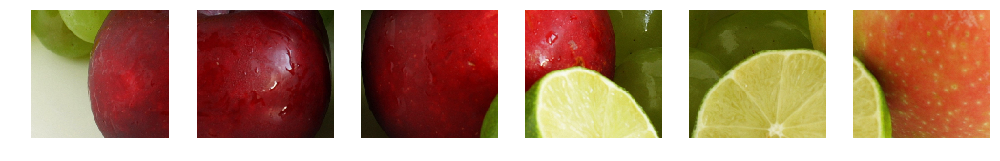

In [6]:
for i in range(4):
    plt.figure(figsize=(18, 4))
    for j in range(6):
        plt.subplot(1, 6, j + 1)
        plt.imshow(X[i * 6 + j].reshape((600, 640, 3)))
        plt.axis('off')
    plt.show()

Напишем несколько функций.
Первая рисует главные компоненты, вторая рисует график доли необъясненной дисперсии.
Третья функция для картинки выполняет все остальные действия.

In [9]:
def draw_components(pca, n, m):
    plt.figure(figsize=(1, 1))
    plt.imshow(pca.mean_.reshape((n, m, 3)), cmap='gray')
    plt.axis('off')
    plt.show()

    for i, comp in enumerate(pca.components_):
        # Определим объект, если начинаем новый ряд
        if i % 10 == 0:
            plt.figure(figsize=(13, 1))
            
        plt.subplot(1, 10, i % 10 + 1)
        plt.imshow(pca.components_[i].reshape((n, m, 3)), cmap='gray')
        plt.axis('off')
        
        # Покажем объект, если ряд заканчивается
        if i % 10 == 9:
            plt.show()
    
    # Если последний ряд заполнился не полностью, его все равно надо показать
    if i % 10 != 9:
        plt.show()
        
        
def draw_residual_variance(X):
    singular_values = sp.linalg.svdvals(X)
    error = singular_values[::-1].cumsum() / singular_values.sum()
    error = error[::-1]

    plt.figure(figsize=(10, 6))
    plt.plot(range(len(error)), error, c='red', linewidth=4)
    plt.show()

        
def image_pca(image, n, m, n_components=20, draw_picture=True, draw_comp=True, draw_rv=True, visualization=True):
    # Показываем исходную картинку
    if draw_picture:
        plt.figure(figsize=(15, 7))
        plt.imshow(image)
        plt.axis('off')
        plt.show()
    
    # Разбиение на блоки
    N, M, K = image.shape
    X = image.transpose((1, 2, 0)).reshape((M, K, N // n, n)) \
             .transpose((1, 2, 3, 0)).reshape((K, N // n, n, M // m, m)) \
             .transpose((1, 3, 2, 4, 0)).reshape((N * M // (n * m), n * m * K))
    X = X.reshape((N * M // (n * m), n * m * K))
    
    # Определение размера сжатия
    size_with_comp = (N * M * K) // ((N * M // (n * m) + n * m * K) * n_components)
    size_without_comp = (N * M * K) // (N * M // (n * m) * n_components)
    print(u'Сжатие в {} раз с учетом главных компонент'.format(round(size_with_comp, 2)))
    print(u'Сжатие в {} раз без учета главных компонент'.format(round(size_without_comp, 2)))
    
    # Применение PCA
    pca = PCA(n_components=n_components)
    Y = pca.fit_transform(X)
    X_hat = pca.inverse_transform(Y)
    
    # Разбираемся с интенсивностью цвета
    max_value = X.max()
    X_hat = X_hat * (X_hat <= max_value) + max_value * (X_hat > max_value)
    X_hat = X_hat * (X_hat >= 0)
    
    # Собираем картинку из блоков
    X_hat = X_hat.reshape((N // n, M // m, n, m, K)).transpose((1, 3, 4, 0, 2))\
                 .reshape((M // m, m, K, N)).transpose((3, 2, 0, 1))\
                 .reshape((N, K, M)).transpose((0, 2, 1))
    
    # Рисуем восстановленную картинку
    plt.figure(figsize=(15, 7))
    plt.imshow(X_hat)
    plt.axis('off')
    plt.show()
    
    # Если нужно, рисуем главные компоненты и график доли необъясненной дисперсии
    if draw_comp:
        draw_components(pca, n, m)
    if draw_rv:
        draw_residual_variance(X)
    
    # Визуализируем проекцию на первые три компоненты (третья - цвет)
    if visualization:
        pca = PCA(n_components=3)
        Y = pca.fit_transform(X)
        plt.figure(figsize=(15, 10))
        plt.scatter(Y[:, 0], Y[:, 1], c=Y[:, 2], alpha=0.1)
        plt.show()

(2400, 3840, 3)


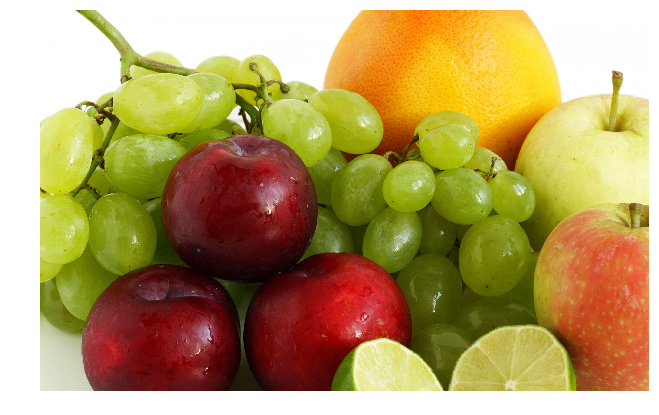

Сжатие в 14 раз с учетом главных компонент
Сжатие в 15 раз без учета главных компонент


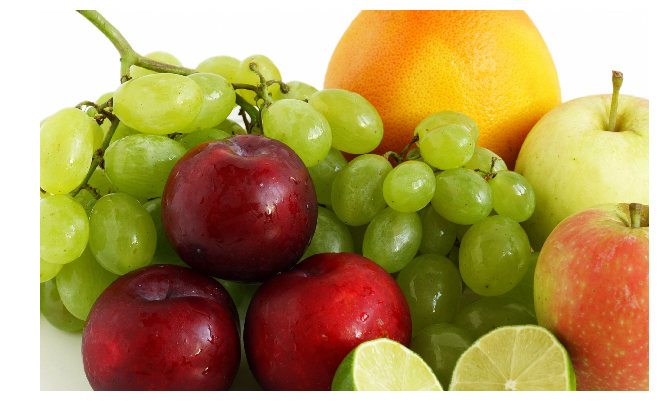

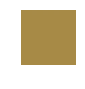

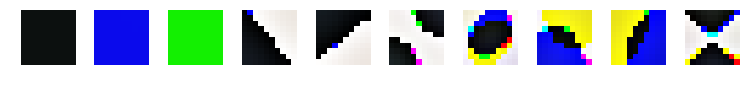

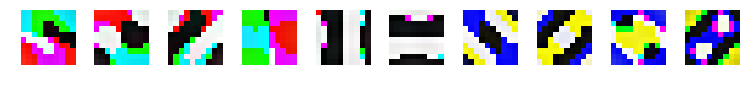

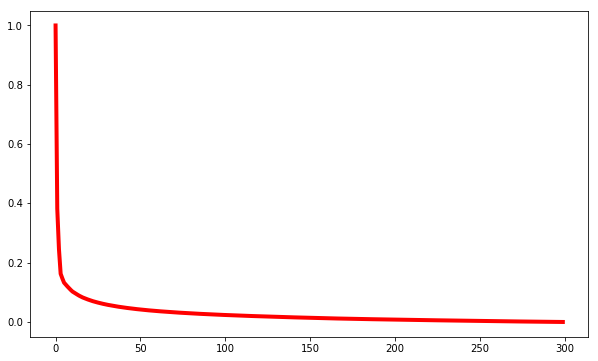

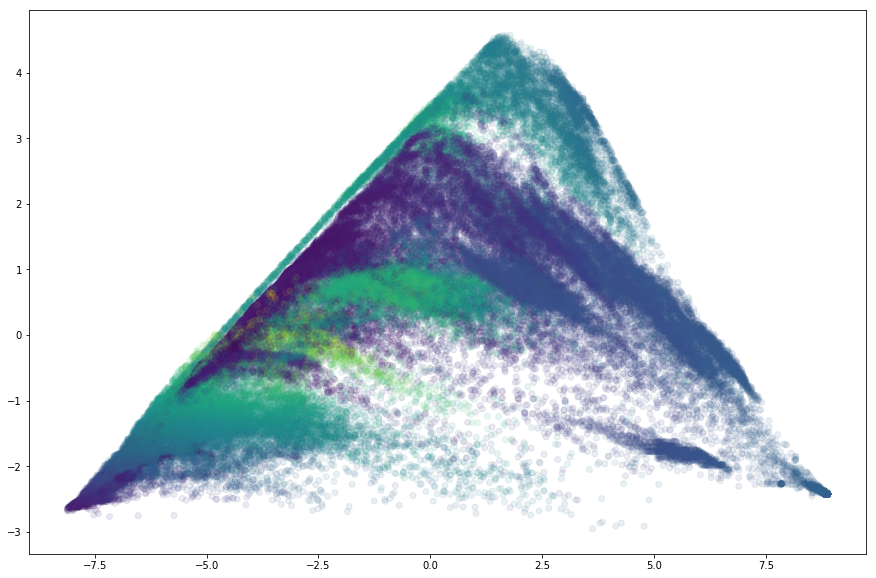

In [10]:
image = plt.imread('3840x2400.png')
print(image.shape)
image_pca(image, 10, 10)

Число компонент 15
Сжатие в 19 раз с учетом главных компонент
Сжатие в 20 раз без учета главных компонент


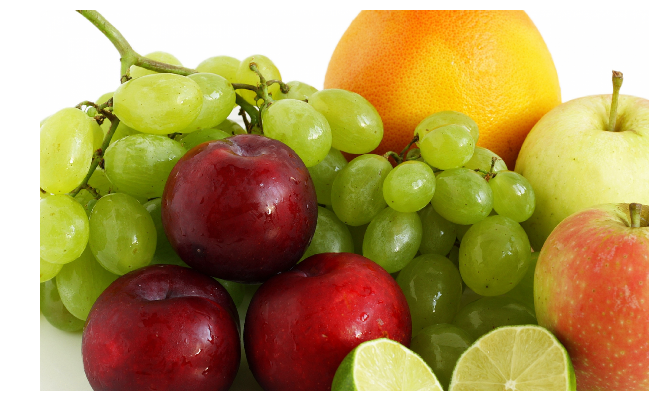

Число компонент 10
Сжатие в 29 раз с учетом главных компонент
Сжатие в 30 раз без учета главных компонент


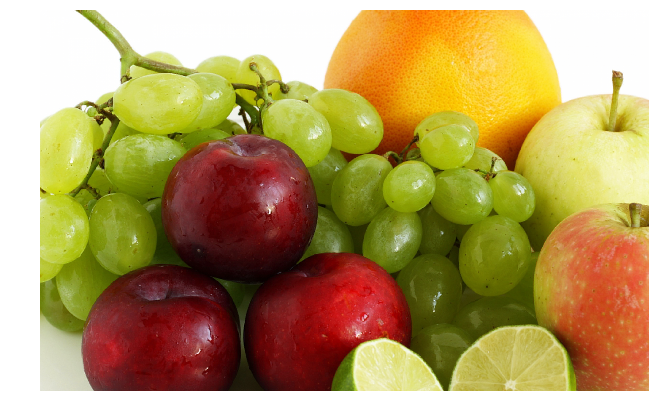

Число компонент 5
Сжатие в 59 раз с учетом главных компонент
Сжатие в 60 раз без учета главных компонент


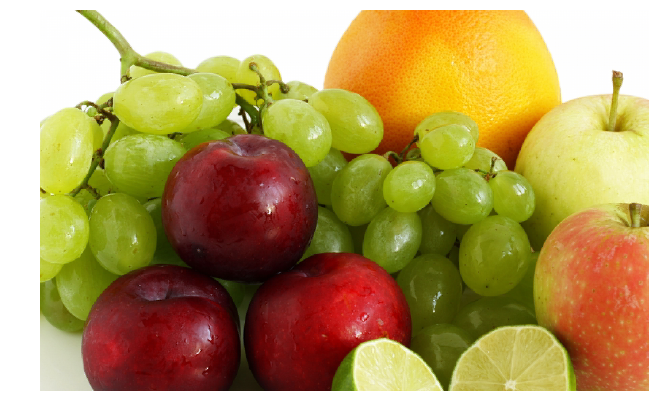

Число компонент 4
Сжатие в 74 раз с учетом главных компонент
Сжатие в 75 раз без учета главных компонент


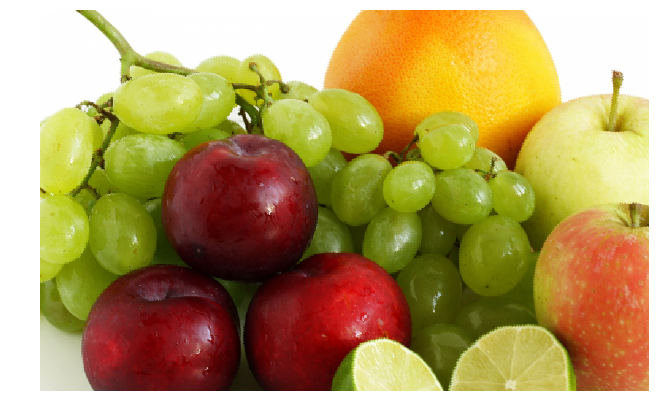

Число компонент 3
Сжатие в 99 раз с учетом главных компонент
Сжатие в 100 раз без учета главных компонент


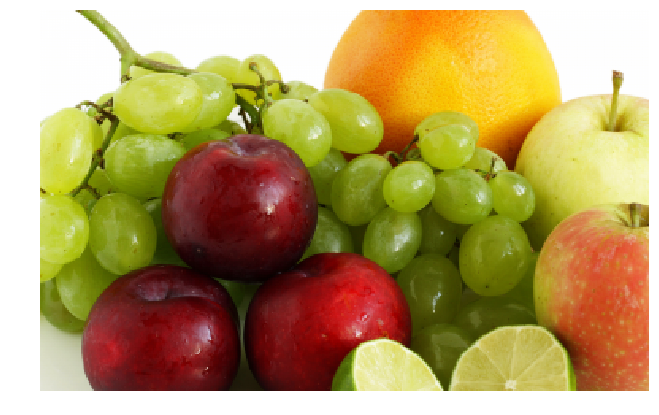

Число компонент 2
Сжатие в 149 раз с учетом главных компонент
Сжатие в 150 раз без учета главных компонент


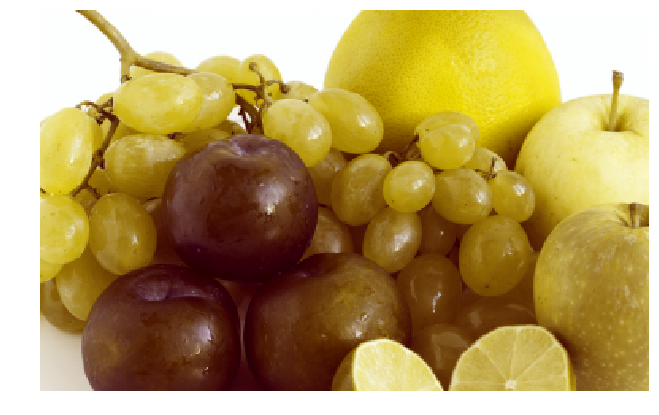

Число компонент 1
Сжатие в 299 раз с учетом главных компонент
Сжатие в 300 раз без учета главных компонент


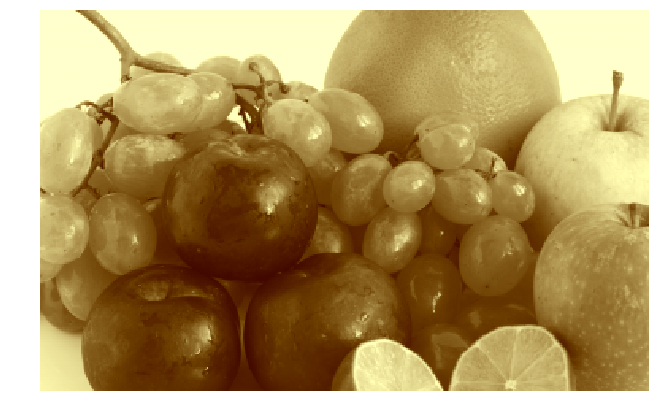

In [11]:
for n_components in [15, 10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image, 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)

(960, 1684, 3)


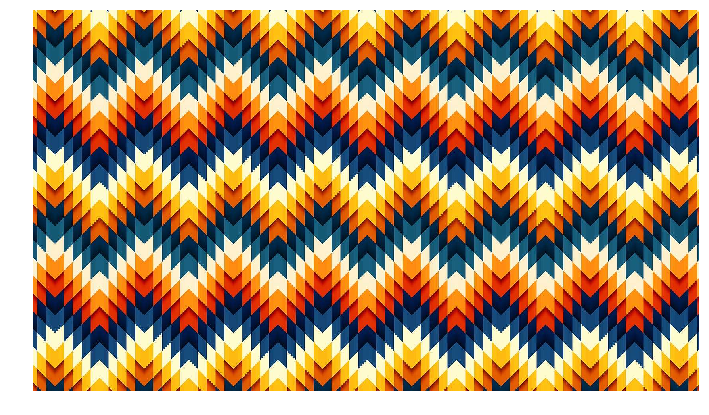

Сжатие в 14 раз с учетом главных компонент
Сжатие в 15 раз без учета главных компонент


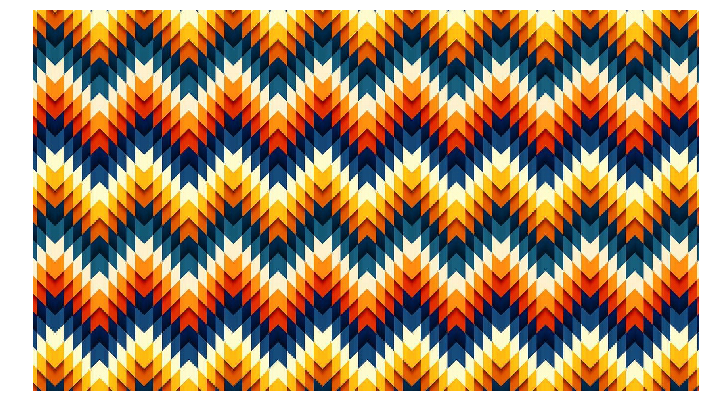

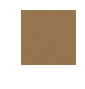

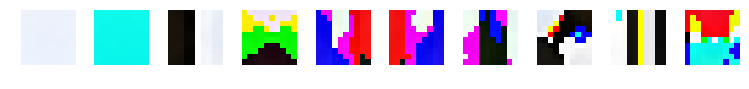

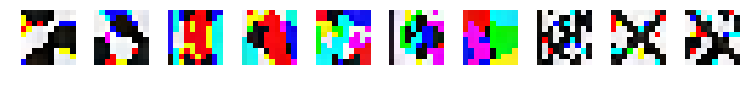

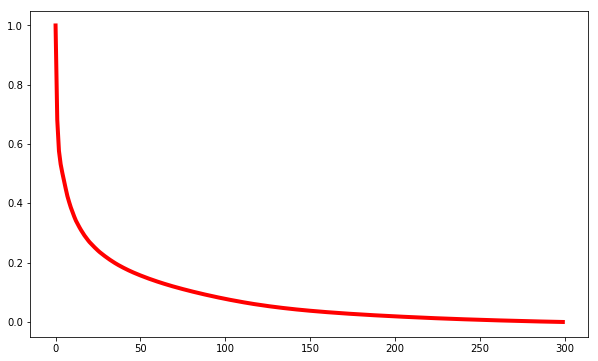

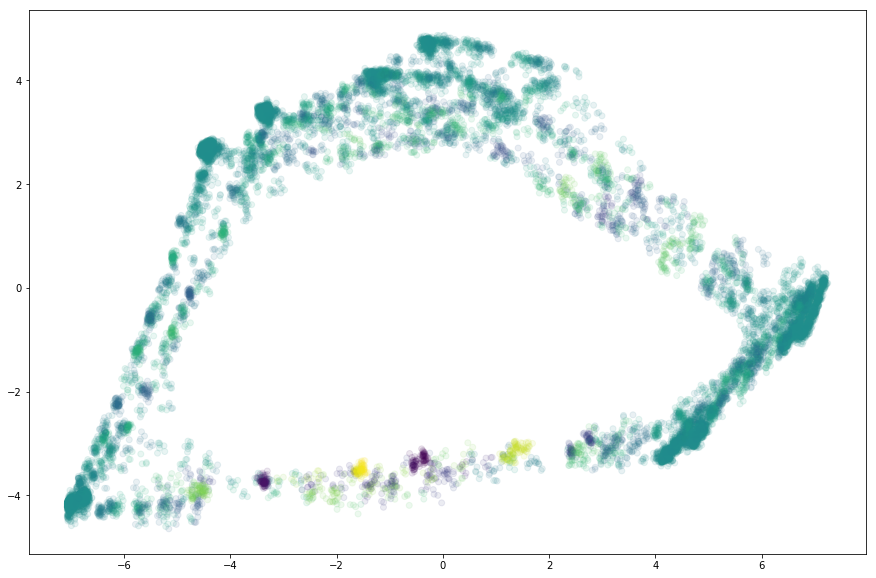

In [12]:
image = plt.imread('pattern.png')
print(image.shape)
image_pca(image[:, :1680, :], 10, 10)

Число компонент 10
Сжатие в 29 раз с учетом главных компонент
Сжатие в 30 раз без учета главных компонент


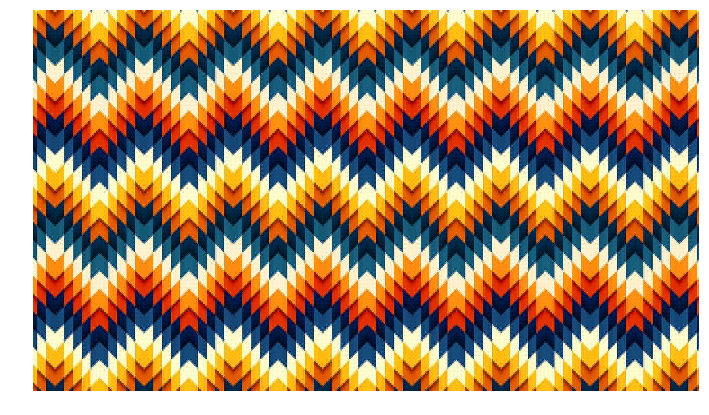

Число компонент 5
Сжатие в 58 раз с учетом главных компонент
Сжатие в 60 раз без учета главных компонент


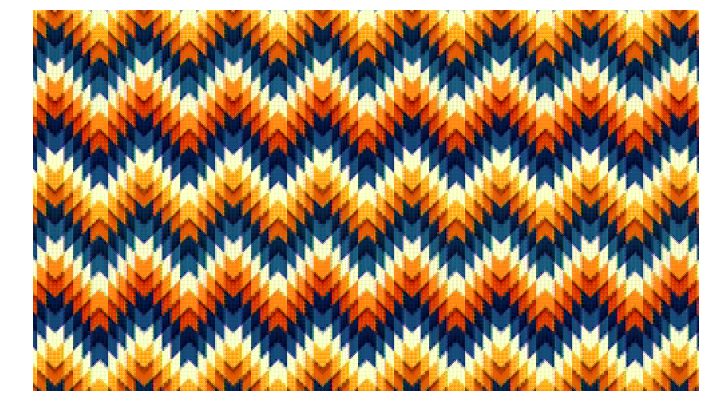

Число компонент 4
Сжатие в 73 раз с учетом главных компонент
Сжатие в 75 раз без учета главных компонент


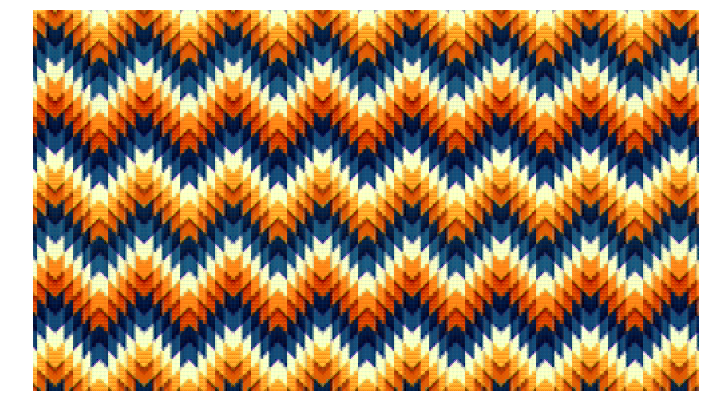

Число компонент 3
Сжатие в 98 раз с учетом главных компонент
Сжатие в 100 раз без учета главных компонент


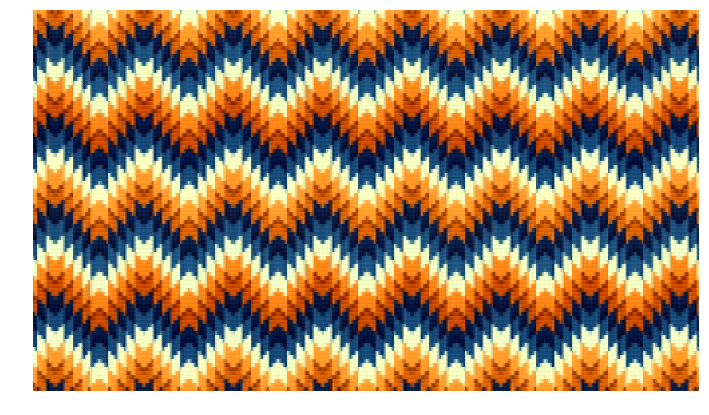

Число компонент 2
Сжатие в 147 раз с учетом главных компонент
Сжатие в 150 раз без учета главных компонент


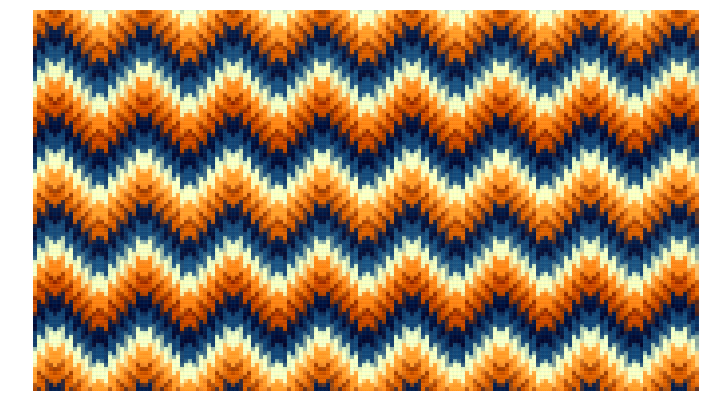

Число компонент 1
Сжатие в 294 раз с учетом главных компонент
Сжатие в 300 раз без учета главных компонент


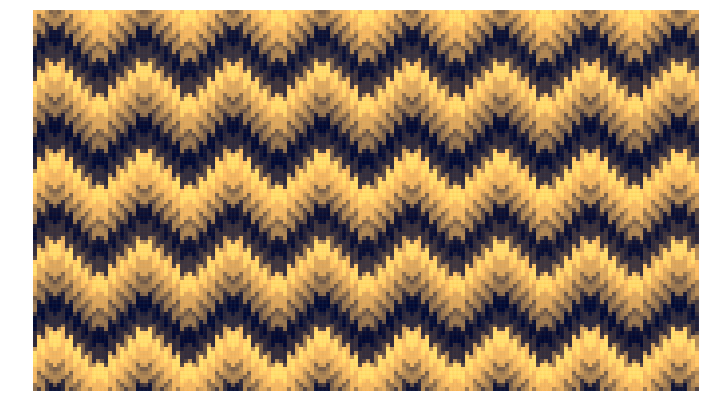

In [13]:
for n_components in [10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image[:, :1680, :], 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)

(819, 1246, 3)


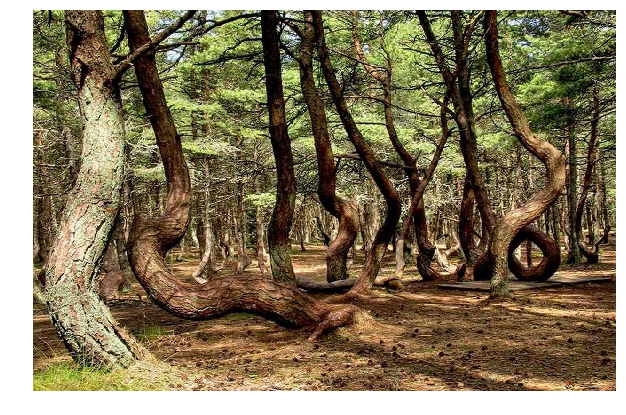

Сжатие в 14 раз с учетом главных компонент
Сжатие в 15 раз без учета главных компонент


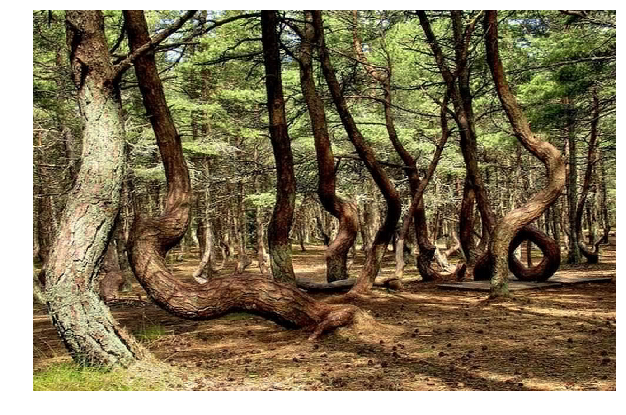

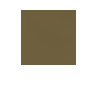

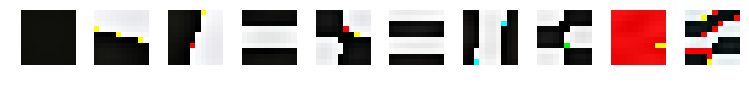

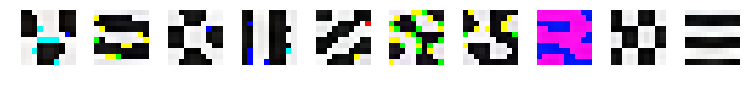

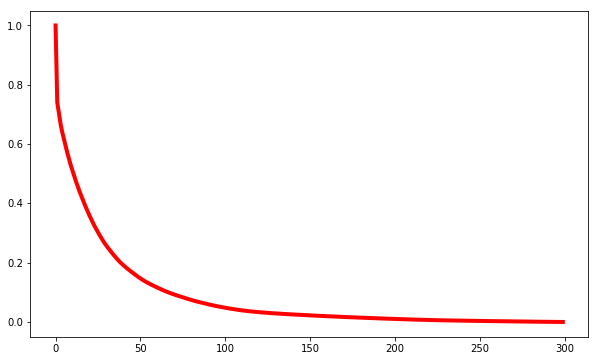

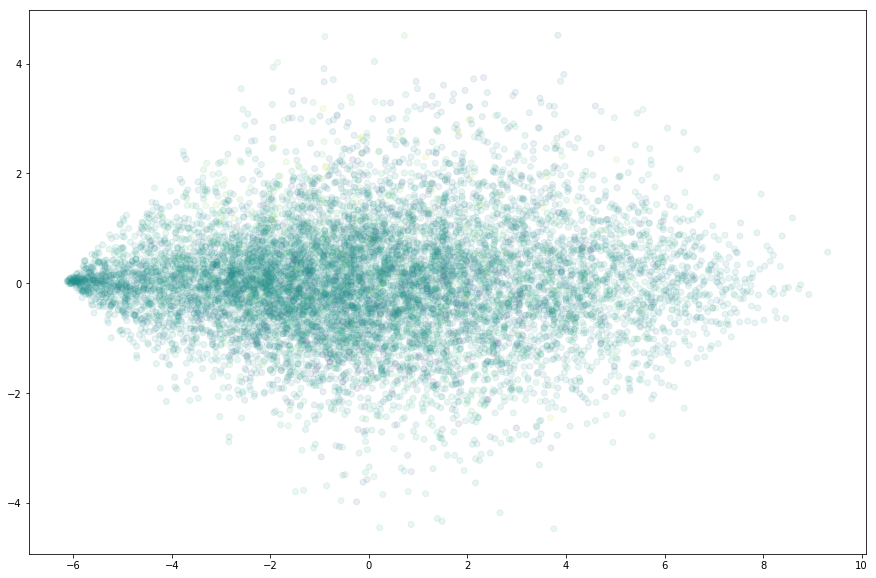

In [14]:
image = plt.imread('forest.png')
print(image.shape)
image_pca(image[:810, :1240, :], 10, 10)

Число компонент 15
Сжатие в 19 раз с учетом главных компонент
Сжатие в 20 раз без учета главных компонент


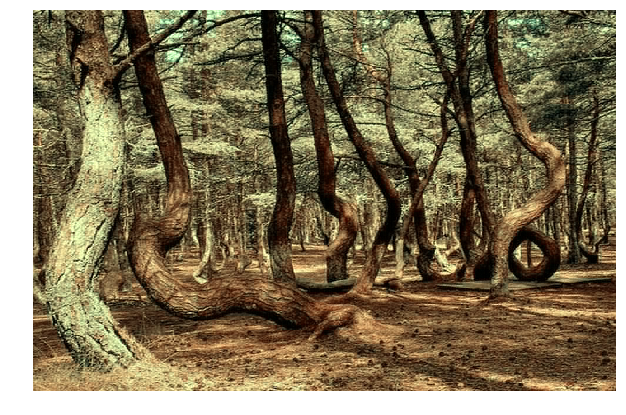

Число компонент 10
Сжатие в 29 раз с учетом главных компонент
Сжатие в 30 раз без учета главных компонент


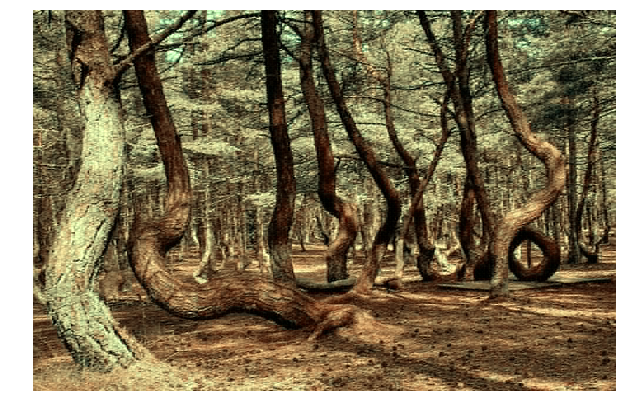

Число компонент 5
Сжатие в 58 раз с учетом главных компонент
Сжатие в 60 раз без учета главных компонент


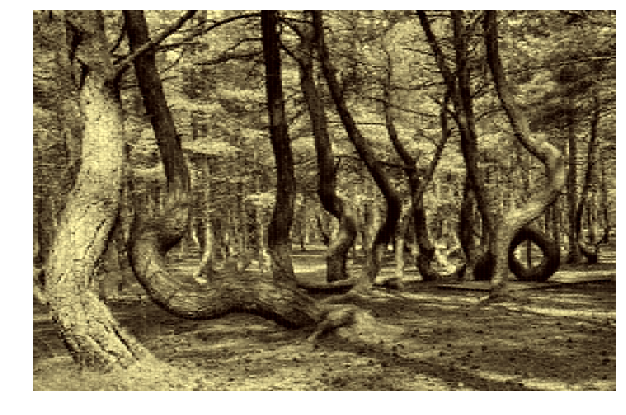

Число компонент 4
Сжатие в 72 раз с учетом главных компонент
Сжатие в 75 раз без учета главных компонент


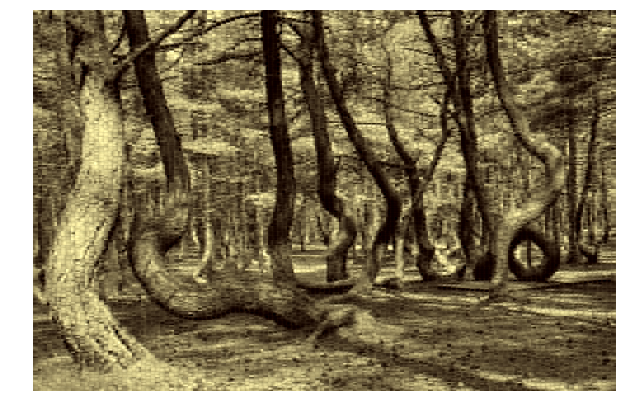

Число компонент 3
Сжатие в 97 раз с учетом главных компонент
Сжатие в 100 раз без учета главных компонент


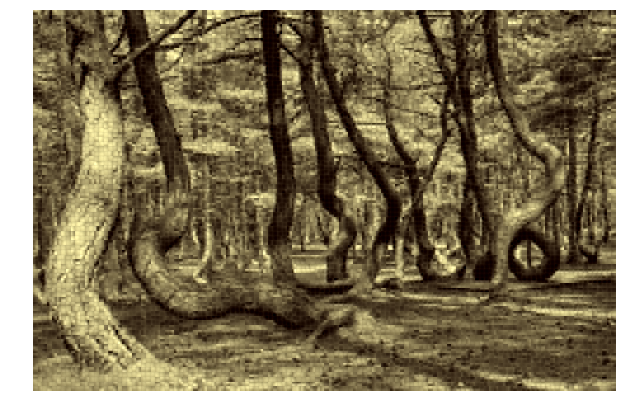

Число компонент 2
Сжатие в 145 раз с учетом главных компонент
Сжатие в 150 раз без учета главных компонент


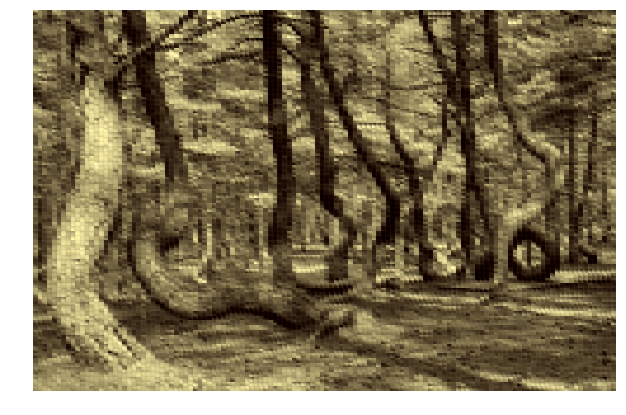

Число компонент 1
Сжатие в 291 раз с учетом главных компонент
Сжатие в 300 раз без учета главных компонент


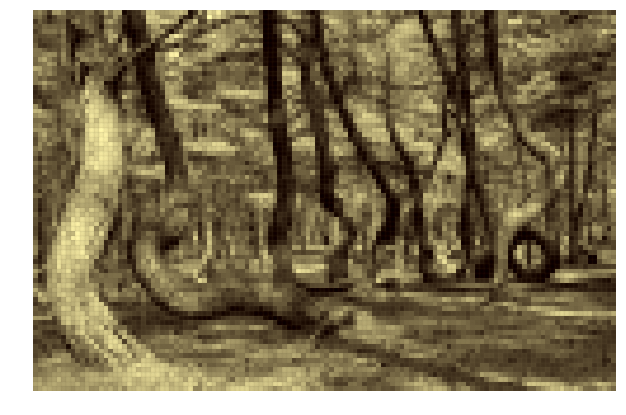

In [15]:
for n_components in [15, 10, 5, 4, 3, 2, 1]:
    print(u'Число компонент {}'.format(n_components))
    image_pca(image[:810, :1240, :], 10, 10, n_components=n_components, draw_picture=False,
              draw_comp=False, draw_rv=False, visualization=False)